## Carga de datos

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

import os
import random
from PIL import Image

In [2]:
pd.set_option('display.max_columns', 100)
pd.set_option('display.max_rows', 100)
pd.set_option('display.float_format', lambda x: '%.2f' % x)

In [3]:
# validamos si esta tensorflow instalado
!pip show tensorflow

Name: tensorflow
Version: 2.19.0
Summary: TensorFlow is an open source machine learning framework for everyone.
Home-page: https://www.tensorflow.org/
Author: Google Inc.
Author-email: packages@tensorflow.org
License: Apache 2.0
Location: /usr/local/lib/python3.12/dist-packages
Requires: absl-py, astunparse, flatbuffers, gast, google-pasta, grpcio, h5py, keras, libclang, ml-dtypes, numpy, opt-einsum, packaging, protobuf, requests, setuptools, six, tensorboard, termcolor, typing-extensions, wrapt
Required-by: dopamine_rl, tensorflow-text, tensorflow_decision_forests, tf_keras


In [4]:
#%%capture
#!pip install --upgrade tensorflow

In [5]:
import tensorflow as tf
from tensorflow import keras

print("tensorflow version: ", tf.__version__)
print("keras version: ", keras.__version__)

tensorflow version:  2.19.0
keras version:  3.10.0


In [6]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [7]:
!ls /content/drive/MyDrive/DataScience/data/datos

metadata.txt  train  validate


In [8]:
!ls /content/drive/MyDrive/DataScience/data/datos/train | head -n 4

1528_bathroom.jpg
1528_bedroom.jpg
1528_frontal.jpg
1528_kitchen.jpg


Número imagenes por cada carpeta

In [9]:
!ls /content/drive/MyDrive/DataScience/data/datos/train -1 | wc -l && ls /content/drive/MyDrive/DataScience/data/datos/validate -1 | wc -l

2088
52


In [10]:
print("Total de imagenes", 2088+52)
print("Total de casas: ", 2140/4)

Total de imagenes 2140
Total de casas:  535.0


Archivo con el precio de las casas, numero de casa, y otras caracteristicas

In [11]:
metadata_df = pd.read_csv('/content/drive/MyDrive/DataScience/data/datos/metadata.txt', sep='|')
display(metadata_df.head())

,img,n_rooms,n_bathrooms,area,zipcode,price
0,1613,5,3.00,2533,94565,540000
1,1656,3,2.00,1640,93446,425000
2,1580,4,2.00,1881,96019,245000
3,1721,4,3.50,3029,91901,825000
4,1581,2,2.00,1240,92276,117000


In [12]:
metadata_df.shape

(535, 6)

Numero de imagenes por cada id de las casas y nombre de espacio al que corresponde

In [13]:
!find /content/drive/MyDrive/DataScience/data/datos/train/ -type f -name "*1581*"

/content/drive/MyDrive/DataScience/data/datos/train/1581_bathroom.jpg
/content/drive/MyDrive/DataScience/data/datos/train/1581_bedroom.jpg
/content/drive/MyDrive/DataScience/data/datos/train/1581_kitchen.jpg
/content/drive/MyDrive/DataScience/data/datos/train/1581_frontal.jpg


Total de imagenes por categoria de la carpeta train

In [14]:
!ls  /content/drive/MyDrive/DataScience/data/datos/train/ | grep 'bedroom' | wc -l
!ls  /content/drive/MyDrive/DataScience/data/datos/train/ | grep 'kitchen' | wc -l
!ls  /content/drive/MyDrive/DataScience/data/datos/train/ | grep 'bathroom' | wc -l
!ls  /content/drive/MyDrive/DataScience/data/datos/train/ | grep 'frontal' | wc -l

522
522
522
522


Total de imagenes por categoria de la carpeta validate

In [15]:
!ls  /content/drive/MyDrive/DataScience/data/datos/validate/ | grep 'bedroom' | wc -l
!ls  /content/drive/MyDrive/DataScience/data/datos/validate/ | grep 'kitchen' | wc -l
!ls  /content/drive/MyDrive/DataScience/data/datos/validate/ | grep 'bathroom' | wc -l
!ls  /content/drive/MyDrive/DataScience/data/datos/validate/ | grep 'frontal' | wc -l

13
13
13
13


En general se tienen `535` casas, de las cuales se tienen `4` imagenes por cada casa que corresponden a `bedroom, kitchen, bathroom, frontal`. Las imagenes se encuentran distribuidas entre las dos carpetas: `train` y `validation`.

In [16]:
# imagenes en carpeta train
images_train = os.listdir('/content/drive/MyDrive/DataScience/data/datos/train')
images_validate = os.listdir('/content/drive/MyDrive/DataScience/data/datos/validate')

img_dir = '/content/drive/MyDrive/DataScience/data/datos'
train_path = os.path.join(img_dir, "train")
validate_path = os.path.join(img_dir, "validate")

display(len(images_train))
display(len(images_validate))

2088

52

In [17]:
metadata_df['bedroom'] = metadata_df['img'].map(lambda x: str(x) + '_bedroom.jpg')
metadata_df['kitchen'] = metadata_df['img'].map(lambda x: str(x) + '_kitchen.jpg')
metadata_df['bathroom'] = metadata_df['img'].map(lambda x: str(x) + '_bathroom.jpg')
metadata_df['frontal'] = metadata_df['img'].map(lambda x: str(x) + '_frontal.jpg')

In [18]:
metadata_df['train/valid'] = metadata_df['bedroom'].map(lambda x: 'train' if x in images_train else 'validate')

In [19]:
metadata_df[metadata_df['train/valid'].isnull()]

,img,n_rooms,n_bathrooms,area,zipcode,price,bedroom,kitchen,bathroom,frontal,train/valid


In [20]:
metadata_df['train/valid'].value_counts()

,count
train/valid,
train,522
validate,13


In [21]:
metadata_df.head()

,img,n_rooms,n_bathrooms,area,zipcode,price,bedroom,kitchen,bathroom,frontal,train/valid
0,1613,5,3.00,2533,94565,540000,1613_bedroom.jpg,1613_kitchen.jpg,1613_bathroom.jpg,1613_frontal.jpg,train
1,1656,3,2.00,1640,93446,425000,1656_bedroom.jpg,1656_kitchen.jpg,1656_bathroom.jpg,1656_frontal.jpg,train
2,1580,4,2.00,1881,96019,245000,1580_bedroom.jpg,1580_kitchen.jpg,1580_bathroom.jpg,1580_frontal.jpg,train
3,1721,4,3.50,3029,91901,825000,1721_bedroom.jpg,1721_kitchen.jpg,1721_bathroom.jpg,1721_frontal.jpg,train
4,1581,2,2.00,1240,92276,117000,1581_bedroom.jpg,1581_kitchen.jpg,1581_bathroom.jpg,1581_frontal.jpg,train


## Exploratory Data Analysis

In [22]:
df_train = metadata_df[metadata_df['train/valid'] == 'train']
df_validate = metadata_df[metadata_df['train/valid'] == 'validate']

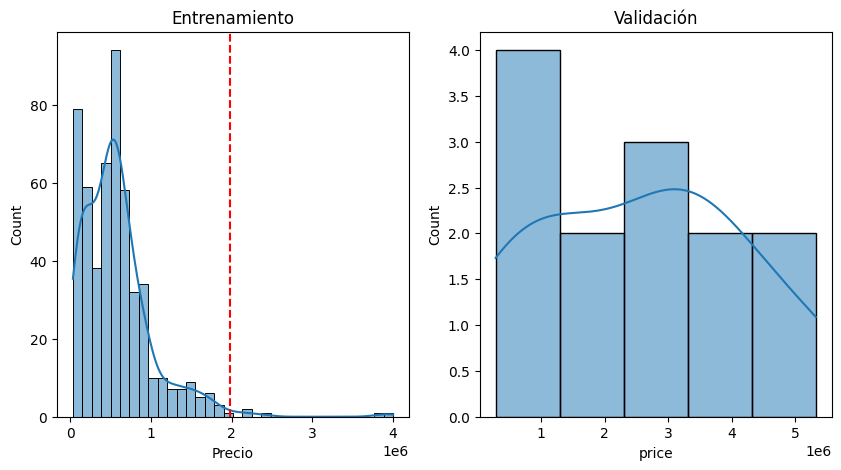

In [23]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(10, 5))

sns.histplot(df_train['price'], ax=axes[0], kde=True)
sns.histplot(df_validate['price'], ax=axes[1], kde=True)

# marcar outliers de otro color
axes[0].axvline(x=df_train['price'].quantile(0.99), color='r', linestyle='--')
axes[0].set_title('Entrenamiento')
axes[0].set_xlabel('Precio')
axes[1].set_title('Validación')

plt.show()

In [24]:
df_train['price'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99]).to_frame().T

,count,mean,std,min,1%,25%,50%,75%,99%,max
price,522.00,579746.39,453996.34,36000.00,62710.00,249900.00,529000.00,727250.00,1977949.21,4000000.00


In [25]:
df_validate['price'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99]).to_frame().T

,count,mean,std,min,1%,25%,50%,75%,99%,max
price,13.00,2553461.54,1653653.26,287000.00,296840.00,1151000.00,3083000.00,3503000.00,5268240.00,5322000.00


,img,n_rooms,n_bathrooms,area,zipcode,price,bedroom,kitchen,bathroom,frontal,train/valid
62,1796,6,5.50,5000,93446,2200000,1796_bedroom.jpg,1796_kitchen.jpg,1796_bathroom.jpg,1796_frontal.jpg,train
285,1644,3,2.00,2971,93446,2395000,1644_bedroom.jpg,1644_kitchen.jpg,1644_bathroom.jpg,1644_frontal.jpg,train
341,1687,4,3.50,4838,95220,1999999,1687_bedroom.jpg,1687_kitchen.jpg,1687_bathroom.jpg,1687_frontal.jpg,train
401,1992,3,3.50,3136,93111,2150000,1992_bedroom.jpg,1992_kitchen.jpg,1992_bathroom.jpg,1992_frontal.jpg,train
413,1543,6,6.50,7000,92677,3850000,1543_bedroom.jpg,1543_kitchen.jpg,1543_bathroom.jpg,1543_frontal.jpg,train
532,1883,5,4.50,5000,93111,4000000,1883_bedroom.jpg,1883_kitchen.jpg,1883_bathroom.jpg,1883_frontal.jpg,train


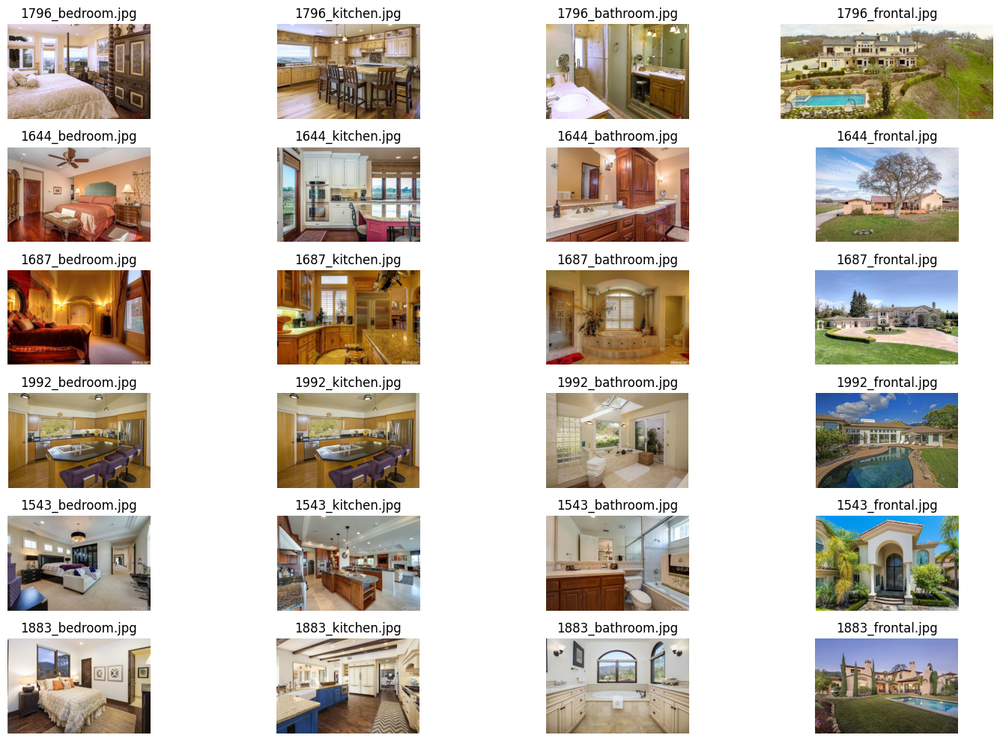

In [26]:
# random_houses = df_train.sample(n=3)
# imagenes de las casas mas baratas/caras del conjunto de entrenamiento
random_houses = df_train[df_train['price'] > df_train['price'].quantile(0.99)]

display(random_houses)

image_types = ['bedroom', 'kitchen', 'bathroom', 'frontal']

fig, axes = plt.subplots(nrows=6, ncols=4, figsize=(15, 10))
axes = axes.flatten()

for i, (index, row) in enumerate(random_houses.iterrows()):
    for j, image_type in enumerate(image_types):
        img_name = row[image_type]
        img_path = os.path.join(train_path, img_name)
        img = Image.open(img_path)
        axes[i * 4 + j].imshow(img)
        axes[i * 4 + j].set_title(img_name)
        axes[i * 4 + j].axis('off')

plt.tight_layout()
plt.show()

,img,n_rooms,n_bathrooms,area,zipcode,price,bedroom,kitchen,bathroom,frontal,train/valid
298,1583,3,3.00,1864,94501,287000,1583_bedroom.jpg,1583_kitchen.jpg,1583_bathroom.jpg,1583_frontal.jpg,validate
228,1848,2,2.00,1020,92276,369000,1848_bedroom.jpg,1848_kitchen.jpg,1848_bathroom.jpg,1848_frontal.jpg,validate
172,1859,3,2.00,1560,96019,855000,1859_bedroom.jpg,1859_kitchen.jpg,1859_bathroom.jpg,1859_frontal.jpg,validate
36,2014,2,2.00,1344,92276,1151000,2014_bedroom.jpg,2014_kitchen.jpg,2014_bathroom.jpg,2014_frontal.jpg,validate
127,1603,4,3.00,2870,92880,1392000,1603_bedroom.jpg,1603_kitchen.jpg,1603_bathroom.jpg,1603_frontal.jpg,validate
514,2018,3,3.00,2808,93510,2229000,2018_bedroom.jpg,2018_kitchen.jpg,2018_bathroom.jpg,2018_frontal.jpg,validate
379,1742,2,2.00,1056,96019,3083000,1742_bedroom.jpg,1742_kitchen.jpg,1742_bathroom.jpg,1742_frontal.jpg,validate
497,1989,2,2.00,1152,92276,3099000,1989_bedroom.jpg,1989_kitchen.jpg,1989_bathroom.jpg,1989_frontal.jpg,validate
181,2035,4,3.00,2454,93510,3184000,2035_bedroom.jpg,2035_kitchen.jpg,2035_bathroom.jpg,2035_frontal.jpg,validate
88,1771,4,3.00,3010,92880,3503000,1771_bedroom.jpg,1771_kitchen.jpg,1771_bathroom.jpg,1771_frontal.jpg,validate


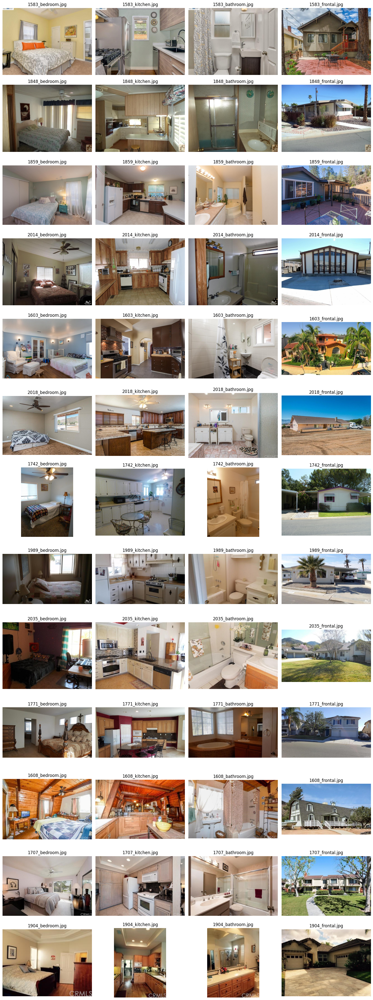

In [27]:
# IMAGENES DE VALIDACION
random_houses = df_validate.sort_values(by='price')
display(random_houses)

image_types = ['bedroom', 'kitchen', 'bathroom', 'frontal']

fig, axes = plt.subplots(nrows=13, ncols=4, figsize=(15, 40))
axes = axes.flatten()

for i, (index, row) in enumerate(random_houses.iterrows()):
    for j, image_type in enumerate(image_types):
        img_name = row[image_type]
        img_path = os.path.join(validate_path, img_name)
        img = Image.open(img_path)
        axes[i * 4 + j].imshow(img)
        axes[i * 4 + j].set_title(img_name)
        axes[i * 4 + j].axis('off')

plt.tight_layout()
plt.show()

Eliminamos outliers

In [28]:
# eliminamos outliers de acuerdo al quantil 99
df_train = df_train[df_train['price'] < df_train['price'].quantile(0.99)]

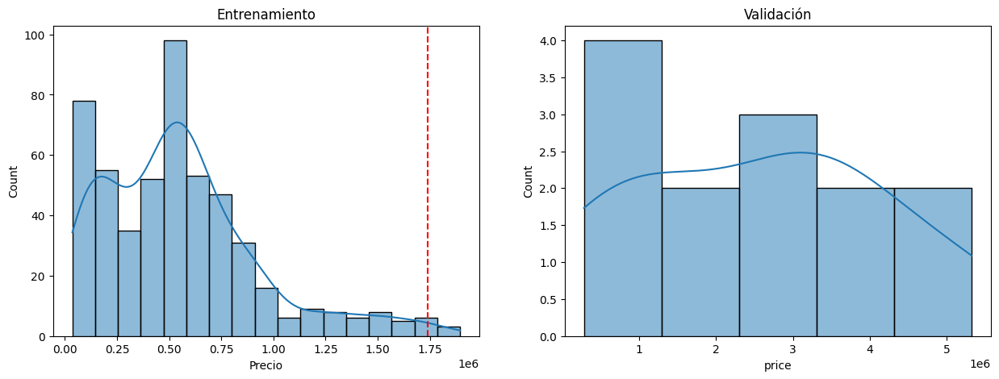

In [29]:
fig, axes = plt.subplots(nrows=1, ncols=2, figsize=(15, 5))

sns.histplot(df_train['price'], ax=axes[0], kde=True)
sns.histplot(df_validate['price'], ax=axes[1], kde=True)

#sns.boxplot(df_train['price'], ax=axes[1])
#sns.boxplot(df_validate['price'], ax=axes[1])

# marcar outliers de otro color
axes[0].axvline(x=df_train['price'].quantile(0.99), color='r', linestyle='--')
axes[0].set_title('Entrenamiento')
axes[0].set_xlabel('Precio')
axes[1].set_title('Validación')

plt.show()

In [30]:
df_train['price'].describe(percentiles=[0.01, 0.25, 0.5, 0.75, 0.99]).to_frame().T

,count,mean,std,min,1%,25%,50%,75%,99%,max
price,516.00,554326.78,379717.36,36000.00,62650.00,247850.00,526900.00,701400.00,1741350.00,1895000.00


Normalizacion de los datos

In [31]:
# Normalizamos los datos
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler = StandardScaler()
Xs = scaler.fit_transform(df_train[['price']])
df_train['price_n'] = Xs.flatten()

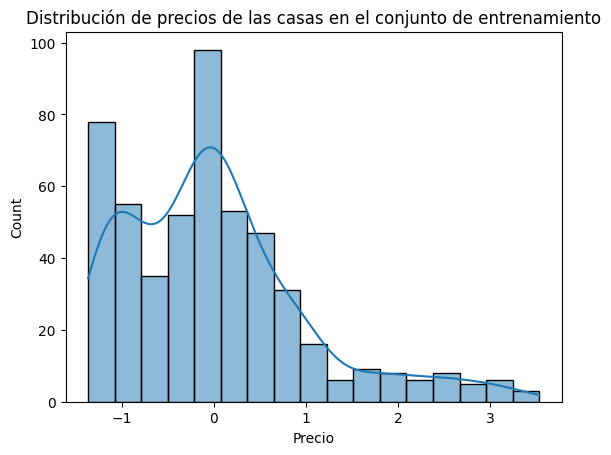

In [32]:
sns.histplot(Xs.flatten(), kde=True)
plt.title('Distribución de precios de las casas en el conjunto de entrenamiento')
plt.xlabel('Precio')
plt.show()

In [33]:
# Normalizamos los datos
from sklearn.preprocessing import MinMaxScaler, StandardScaler

scaler_y = StandardScaler()
ys = scaler_y.fit_transform(df_validate[['price']])
df_validate['price_n'] = ys.flatten()

/tmp/ipython-input-219386774.py:6: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_validate['price_n'] = ys.flatten()


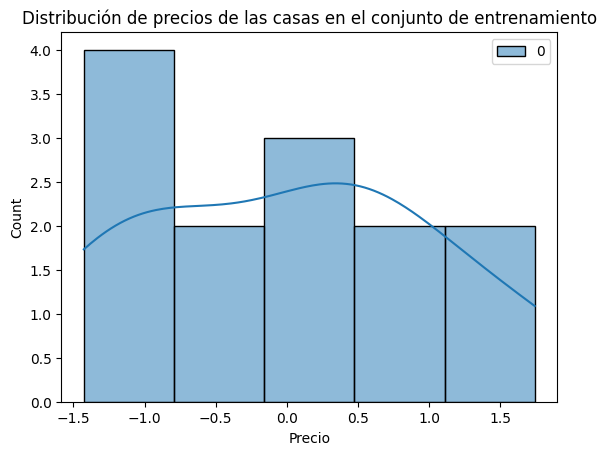

In [34]:
sns.histplot(ys, kde=True)
plt.title('Distribución de precios de las casas en el conjunto de entrenamiento')
plt.xlabel('Precio')
plt.show()

Carpeta de imagenes

In [35]:
print(train_path)
print(validate_path)

/content/drive/MyDrive/DataScience/data/datos/train
/content/drive/MyDrive/DataScience/data/datos/validate


## Modelado 1

In [36]:
%%capture
!pip install opencv-python

In [37]:
import os
import numpy as np
import pandas as pd
import cv2
from tensorflow.keras import regularizers
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, BatchNormalization
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.callbacks import EarlyStopping, ModelCheckpoint, ReduceLROnPlateau


### Parametros

In [38]:
IMG_SIZE = 256 # tamanio de la imagen
CHANNELS = 3
BATCH_SIZE = 8
EPOCHS = 30

print(df_train.shape)
print(df_validate.shape)

(516, 12)
(13, 12)


### Training/Validation

In [39]:
print(train_path)
print(validate_path)

/content/drive/MyDrive/DataScience/data/datos/train
/content/drive/MyDrive/DataScience/data/datos/validate


In [40]:
print(df_train.shape)
print(df_validate.shape)

(516, 12)
(13, 12)


In [41]:
img_dir = '/content/drive/MyDrive/DataScience/data/datos'
train_path = os.path.join(img_dir, "train")
validate_path = os.path.join(img_dir, "validate")


In [42]:
def load_and_preprocess_image(path, img_size=IMG_SIZE):
    img = cv2.imread(path)
    img = cv2.resize(img, (img_size, img_size))
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    img = img / 255.0
    return img

def combine_images(img_paths):
    """Load 4 images and put them in a 2x2 grid"""
    imgs = [load_and_preprocess_image(p) for p in img_paths]
    top = np.concatenate((imgs[0], imgs[1]), axis=1)
    bottom = np.concatenate((imgs[2], imgs[3]), axis=1)
    combined = np.concatenate((top, bottom), axis=0)
    return combined

### Datos de entrenamiento

In [43]:
X_train = []
y_train = []

for _, row in df_train.iterrows():
    img_paths = [
        os.path.join(train_path, row["bedroom"]),
        os.path.join(train_path, row["kitchen"]),
        os.path.join(train_path, row["bathroom"]),
        os.path.join(train_path, row["frontal"])
    ]
    combined_img = combine_images(img_paths)
    X_train.append(combined_img)
    y_train.append(row["price_n"])

X_train = np.array(X_train)
y_train = np.array(y_train)


In [44]:
print("Dataset shape:", X_train.shape, y_train.shape)

Dataset shape: (516, 512, 512, 3) (516,)


### Datos de validacion

In [45]:
X_valid = []
y_valid = []

for _, row in df_validate.iterrows():
    img_paths = [
        os.path.join(validate_path, row["bedroom"]),
        os.path.join(validate_path, row["kitchen"]),
        os.path.join(validate_path, row["bathroom"]),
        os.path.join(validate_path, row["frontal"])
    ]
    combined_img = combine_images(img_paths)
    X_valid.append(combined_img)
    y_valid.append(row["price_n"])

X_valid = np.array(X_valid)
y_valid = np.array(y_valid)

In [46]:
print("Dataset shape:", X_valid.shape, y_valid.shape)

Dataset shape: (13, 512, 512, 3) (13,)


### Modelo

In [47]:
model = Sequential([
    Conv2D(32, (3,3), activation='relu', padding='same', input_shape=(IMG_SIZE*2, IMG_SIZE*2, CHANNELS)),
    BatchNormalization(-1),
    MaxPooling2D((2,2)),
    Dropout(0.2),

    Conv2D(64, (3,3), activation='relu', padding='same'),
    BatchNormalization(-1),
    MaxPooling2D((2,2)),
    Dropout(0.2),

    Conv2D(128, (3,3), activation='relu', padding='same'),
    BatchNormalization(-1),
    MaxPooling2D((2,2)),
    Dropout(0.2),

    Flatten(),
    Dense(16, activation='relu'),
    BatchNormalization(-1),
    Dropout(0.5),
    Dense(4, activation='relu'),
    Dense(1, activation='linear')
])

model.compile(optimizer=Adam(1e-4), loss="mse", metrics=["mae"])
model.summary()

/usr/local/lib/python3.12/dist-packages/keras/src/layers/convolutional/base_conv.py:113: UserWarning: Do not pass an `input_shape`/`input_dim` argument to a layer. When using Sequential models, prefer using an `Input(shape)` object as the first layer in the model instead.
  super().__init__(activity_regularizer=activity_regularizer, **kwargs)


Model: "sequential"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━┓
┃ Layer (type)                    ┃ Output Shape           ┃       Param # ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━┩
│ conv2d (Conv2D)                 │ (None, 512, 512, 32)   │           896 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization             │ (None, 512, 512, 32)   │           128 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d (MaxPooling2D)    │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout (Dropout)               │ (None, 256, 256, 32)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_1 (Conv2D)               │ (None, 256, 256, 64)   │        18,496 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_1           │ (None, 256, 256, 64)   │           256 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_1 (MaxPooling2D)  │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_1 (Dropout)             │ (None, 128, 128, 64)   │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ conv2d_2 (Conv2D)               │ (None, 128, 128, 128)  │        73,856 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_2           │ (None, 128, 128, 128)  │           512 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ max_pooling2d_2 (MaxPooling2D)  │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_2 (Dropout)             │ (None, 64, 64, 128)    │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ flatten (Flatten)               │ (None, 524288)         │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense (Dense)                   │ (None, 16)             │     8,388,624 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ batch_normalization_3           │ (None, 16)             │            64 │
│ (BatchNormalization)            │                        │               │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dropout_3 (Dropout)             │ (None, 16)             │             0 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_1 (Dense)                 │ (None, 4)              │            68 │
├─────────────────────────────────┼────────────────────────┼───────────────┤
│ dense_2 (Dense)                 │ (None, 1)              │             5 │
└─────────────────────────────────┴────────────────────────┴───────────────┘

 Total params: 8,482,905 (32.36 MB)

 Trainable params: 8,482,425 (32.36 MB)

 Non-trainable params: 480 (1.88 KB)

### Callbacks

In [51]:
callbacks = [
    EarlyStopping(monitor="val_mae", patience=15, restore_best_weights=True, verbose=1),
    ModelCheckpoint("house_prediction_model_{val_mae:.3f}.h5",
                    monitor="val_mae", save_weights_only=False, save_best_only=True, verbose=1)]

### Entrenamiento

In [52]:
history = model.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    epochs=EPOCHS,
    batch_size=BATCH_SIZE,
    callbacks=callbacks
)

Epoch 1/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 1.8132 - mae: 1.0368
Epoch 1: val_mae improved from inf to 5.41640, saving model to house_prediction_model_5.416.h5


65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 97ms/step - loss: 1.8099 - mae: 1.0357 - val_loss: 36.6754 - val_mae: 5.4164
Epoch 2/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 1.6619 - mae: 0.9715
Epoch 2: val_mae improved from 5.41640 to 3.17223, saving model to house_prediction_model_3.172.h5


65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 93ms/step - loss: 1.6577 - mae: 0.9702 - val_loss: 14.9450 - val_mae: 3.1722
Epoch 3/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 1.2973 - mae: 0.8798
Epoch 3: val_mae improved from 3.17223 to 1.37869, saving model to house_prediction_model_1.379.h5


65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 95ms/step - loss: 1.2975 - mae: 0.8798 - val_loss: 4.0489 - val_mae: 1.3787
Epoch 4/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 1.3206 - mae: 0.8611
Epoch 4: val_mae did not improve from 1.37869
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 1.3185 - mae: 0.8606 - val_loss: 77.9535 - val_mae: 5.8590
Epoch 5/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 1.1351 - mae: 0.8311
Epoch 5: val_mae did not improve from 1.37869
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 91ms/step - loss: 1.1359 - mae: 0.8311 - val_loss: 747.7045 - val_mae: 21.4170
Epoch 6/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 1.1269 - mae: 0.8193
Epoch 6: val_mae did not improve from 1.37869
65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 91ms/step - loss: 1.1287 - mae: 0.8193 - val_loss: 1432.2136 - val_mae: 33.4741
Epoch 7/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 1.0169 - mae: 0.7722
Epoch 7: val_mae did not improve from 1.37869
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 90ms/step - loss: 1.0157 - mae: 

65/65 ━━━━━━━━━━━━━━━━━━━━ 11s 92ms/step - loss: 0.8499 - mae: 0.7341 - val_loss: 1.6296 - val_mae: 1.0137
Epoch 14/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.7168 - mae: 0.6373
Epoch 14: val_mae did not improve from 1.01370
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 88ms/step - loss: 0.7171 - mae: 0.6377 - val_loss: 2.1663 - val_mae: 1.1191
Epoch 15/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step - loss: 0.6683 - mae: 0.6519
Epoch 15: val_mae improved from 1.01370 to 0.87564, saving model to house_prediction_model_0.876.h5


65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 95ms/step - loss: 0.6687 - mae: 0.6517 - val_loss: 1.0204 - val_mae: 0.8756
Epoch 16/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.7756 - mae: 0.6655
Epoch 16: val_mae did not improve from 0.87564
65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 89ms/step - loss: 0.7747 - mae: 0.6650 - val_loss: 1.0786 - val_mae: 0.8924
Epoch 17/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.6791 - mae: 0.6487
Epoch 17: val_mae did not improve from 0.87564
65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.6796 - mae: 0.6488 - val_loss: 1.0776 - val_mae: 0.8936
Epoch 18/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.7900 - mae: 0.6789
Epoch 18: val_mae improved from 0.87564 to 0.85834, saving model to house_prediction_model_0.858.h5


65/65 ━━━━━━━━━━━━━━━━━━━━ 6s 96ms/step - loss: 0.7883 - mae: 0.6781 - val_loss: 1.0023 - val_mae: 0.8583
Epoch 19/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.8278 - mae: 0.6805
Epoch 19: val_mae did not improve from 0.85834
65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.8254 - mae: 0.6794 - val_loss: 1.1546 - val_mae: 0.9144
Epoch 20/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 87ms/step - loss: 0.6613 - mae: 0.6311
Epoch 20: val_mae did not improve from 0.85834
65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 88ms/step - loss: 0.6600 - mae: 0.6302 - val_loss: 1.0720 - val_mae: 0.9036
Epoch 21/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 88ms/step - loss: 0.6294 - mae: 0.6206
Epoch 21: val_mae did not improve from 0.85834
65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 89ms/step - loss: 0.6318 - mae: 0.6213 - val_loss: 1.2380 - val_mae: 0.9440
Epoch 22/30
64/65 ━━━━━━━━━━━━━━━━━━━━ 0s 89ms/step - loss: 0.6220 - mae: 0.5889
Epoch 22: val_mae did not improve from 0.85834
65/65 ━━━━━━━━━━━━━━━━━━━━ 10s 90ms/step - loss: 0.6225 - mae

In [53]:
# save the m,odel
best_model = keras.models.load_model("/content/house_prediction_model_0.858.h5", custom_objects={'mse': tf.keras.losses.MeanSquaredError(), 'mae': tf.keras.metrics.MeanAbsoluteError()})

### Evaluacion del modelo

In [54]:
# make predictions
predictions = model.predict(X_valid)

# save the predictions on dataframe
df_validate['price_pred'] = scaler_y.inverse_transform(predictions)

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step


/tmp/ipython-input-3763061072.py:5: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_validate['price_pred'] = scaler_y.inverse_transform(predictions)


In [58]:
df_validate[['img', 'price', 'price_pred']].sort_values(by='img')

,img,price,price_pred
298,1583,287000,2868898.75
127,1603,1392000,3048217.00
116,1608,3847000,3934334.50
64,1707,4874000,2628185.25
379,1742,3083000,2628185.25
88,1771,3503000,3278108.75
228,1848,369000,2463152.00
172,1859,855000,2628185.25
26,1904,5322000,3060438.75
497,1989,3099000,2471906.75


Text(0.5, 1.0, 'Real vs Predicted Prices')

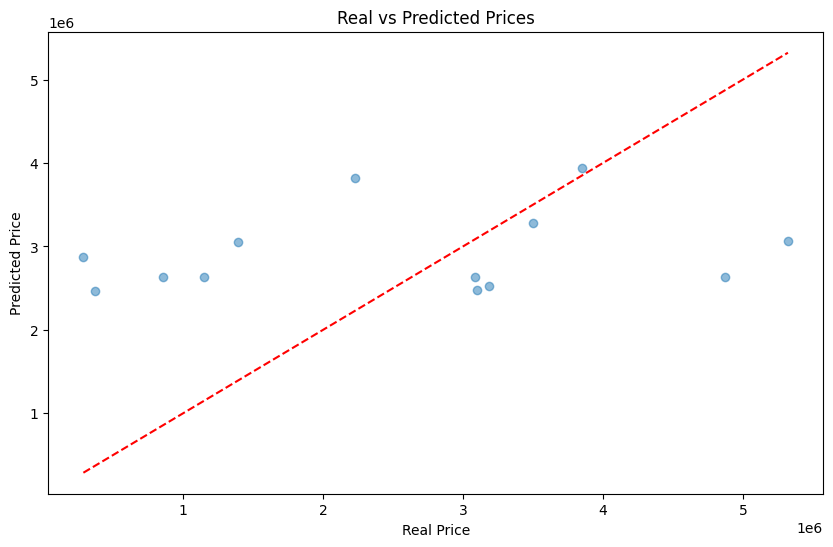

In [56]:
y_true = df_validate['price']
y_pred = df_validate['price_pred']

# plot preduicted values vs real values
plt.figure(figsize=(10, 6))
plt.scatter(y_true, y_pred, alpha=0.5)
plt.plot([min(y_true), max(y_true)], [min(y_true), max(y_true)], linestyle='--', color='red')
plt.xlabel('Real Price')
plt.ylabel('Predicted Price')
plt.title('Real vs Predicted Prices')